In [54]:
import networkx as nx
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch_geometric.utils import from_networkx
from sklearn.preprocessing import LabelEncoder, StandardScaler

import numpy as np

import matplotlib.pyplot as plt

def load_graph(file_path):
    """Charge un graphe au format GraphML."""
    return nx.read_graphml(file_path)

def extract_node_attributes(graph):
    """Extrait les attributs des nœuds du graphe."""
    populations = [data['population'] for _, data in graph.nodes(data=True)]
    latitudes = [data['lat'] for _, data in graph.nodes(data=True)]
    longitudes = [data['lon'] for _, data in graph.nodes(data=True)]
    countries = [data['country'] for _, data in graph.nodes(data=True)]
    city_names = [data['city_name'] for _, data in graph.nodes(data=True)]
    return populations, latitudes, longitudes, countries, city_names

def encode_labels(labels):
    """Encode les étiquettes en entiers."""
    label_encoder = LabelEncoder()
    encoded_labels = label_encoder.fit_transform(labels)
    return encoded_labels, label_encoder

def create_embeddings(data_list, embedding_dim):
    """Crée des embeddings pour les données catégoriques."""
    unique_values = set(data_list)
    value_to_idx = {value: idx for idx, value in enumerate(unique_values)}
    indices = torch.tensor([value_to_idx[val] for val in data_list], dtype=torch.long)
    embeddings = nn.Embedding(len(unique_values), embedding_dim)
    embedded = embeddings(indices)
    return embedded, value_to_idx

def normalize_features(features):
    """Normalise les caractéristiques des nœuds."""
    scaler = StandardScaler()
    features_normalized = scaler.fit_transform(features.detach().numpy())
    return torch.tensor(features_normalized, dtype=torch.float32)

def prepare_node_features(populations, latitudes, longitudes, country_embedded, city_embedded):
    """Prépare les caractéristiques des nœuds en les combinant."""
    populations_tensor = torch.tensor(populations, dtype=torch.float32).view(-1, 1)
    latitudes_tensor = torch.tensor(latitudes, dtype=torch.float32).view(-1, 1)
    longitudes_tensor = torch.tensor(longitudes, dtype=torch.float32).view(-1, 1)
    features = torch.cat([populations_tensor, latitudes_tensor, longitudes_tensor, country_embedded, city_embedded], dim=1)
    return features

def create_pyg_graph(graph, node_features, encoded_labels):
    """Crée un graphe compatible PyTorch Geometric."""
    pyg_graph = from_networkx(graph)
    pyg_graph.x = node_features
    pyg_graph.y = torch.tensor(encoded_labels, dtype=torch.long)
    pyg_graph.num_classes = len(set(encoded_labels))
    return pyg_graph

def visualize_graph(graph, labels, label_encoder):
    """Affiche le graphe avec les nœuds colorés selon leurs étiquettes."""
    plt.figure(figsize=(80, 80))
    
    # Associer les nœuds à leurs étiquettes encodées
    node_to_label = {node: labels[i] for i, node in enumerate(graph.nodes())}
    
    # Obtenir les couleurs des nœuds en fonction des étiquettes
    colors = [node_to_label[node] for node in graph.nodes]
    
    # Dessiner le graphe avec une mise en page de type spring
    pos = nx.spring_layout(graph, seed=42)  # Positionner les nœuds de manière plus lisible
    nodes = nx.draw_networkx_nodes(graph, pos, node_size=30, node_color=colors, cmap=plt.cm.jet, alpha=0.8)
    nx.draw_networkx_edges(graph, pos, alpha=0.5)
    
    
    plt.title("Visualisation du graphe avec les nœuds colorés selon leurs étiquettes")
    plt.show()

def visualize_graph_with_geo(graph, latitudes, longitudes, labels, label_encoder):
    """Affiche le graphe avec les nœuds positionnés selon leur latitude et longitude."""
    plt.figure(figsize=(12, 8))
    
    # Associer les nœuds à leurs étiquettes encodées
    node_to_label = {node: labels[i] for i, node in enumerate(graph.nodes())}
    
    # Obtenir les couleurs des nœuds en fonction des étiquettes
    colors = [node_to_label[node] for node in graph.nodes()]
    
    # Créer un mappage de nœuds à leurs indices
    node_to_index = {node: idx for idx, node in enumerate(graph.nodes())}
    
    # Dessiner les nœuds avec les coordonnées géographiques
    scatter = plt.scatter(longitudes, latitudes, c=colors, cmap=plt.cm.jet, alpha=0.8, s=30)
    
    # Dessiner les arêtes
    for edge in graph.edges():
        # Utiliser le mappage pour obtenir les indices
        x_coords = [longitudes[node_to_index[edge[0]]], longitudes[node_to_index[edge[1]]]]
        y_coords = [latitudes[node_to_index[edge[0]]], latitudes[node_to_index[edge[1]]]]
        plt.plot(x_coords, y_coords, color='black', alpha=0.01)
    
    # Créer un ScalarMappable pour la barre de couleurs
    sm = plt.cm.ScalarMappable(cmap=plt.cm.jet, norm=plt.Normalize(vmin=min(colors), vmax=max(colors)))
    sm.set_array([])
    
    plt.title("Visualisation du graphe avec les nœuds positionnés selon latitude et longitude")
    plt.xlabel("Longitude")
    plt.ylabel("Latitude")
    plt.grid()
    plt.show()

# --- Script principal ---
# Charger le fichier GraphML
graph = load_graph("airportsAndCoordAndPop.graphml")
print("Graphe chargé avec", graph.number_of_nodes(), "nœuds et", graph.number_of_edges(), "arêtes.")

# Extraire les attributs des nœuds
populations, latitudes, longitudes, countries, city_names = extract_node_attributes(graph)
print("Exemple de populations:", populations[:5])
print("Exemple de latitudes:", latitudes[:5])
print("Exemple de longitudes:", longitudes[:5])

# Encoder les étiquettes
encoded_labels, label_encoder = encode_labels(countries)
print("Exemple d'étiquettes encodées:", encoded_labels[:5])
print("Nombre de classes:", len(label_encoder.classes_))

# Créer des embeddings pour les pays et les noms de villes
country_embedded, _ = create_embeddings(countries, embedding_dim=4)
city_embedded, _ = create_embeddings(city_names, embedding_dim=4)
print("Dimensions des embeddings pays:", country_embedded.shape)
print("Dimensions des embeddings villes:", city_embedded.shape)

# Préparer les caractéristiques des nœuds
node_features = prepare_node_features(populations, latitudes, longitudes, country_embedded, city_embedded)
print("Dimensions des caractéristiques des nœuds avant normalisation:", node_features.shape)

# Normaliser les caractéristiques
node_features = normalize_features(node_features)
print("Dimensions des caractéristiques des nœuds après normalisation:", node_features.shape)

# Créer le graphe PyTorch Geometric
pyg_graph = create_pyg_graph(graph, node_features, encoded_labels)
print("Graphe PyTorch Geometric créé avec", pyg_graph.num_nodes, "nœuds et", pyg_graph.num_edges, "arêtes.")
print("Exemple des caractéristiques du premier nœud:", pyg_graph.x[0])
print("Exemple de l'étiquette du premier nœud:", pyg_graph.y[0])





Graphe chargé avec 3363 nœuds et 13547 arêtes.
Exemple de populations: [10000, 10000, 26357, 10000, 10000]
Exemple de latitudes: [-17.35388888888889, -18.066666666666666, -17.55, -23.033333333333335, -16.584888888888887]
Exemple de longitudes: [-145.50972222222222, -140.95, -149.6, -135.0, -143.65725]
Exemple d'étiquettes encodées: [66 66 66 66 66]
Nombre de classes: 212
Dimensions des embeddings pays: torch.Size([3363, 4])
Dimensions des embeddings villes: torch.Size([3363, 4])
Dimensions des caractéristiques des nœuds avant normalisation: torch.Size([3363, 11])
Dimensions des caractéristiques des nœuds après normalisation: torch.Size([3363, 11])
Graphe PyTorch Geometric créé avec 3363 nœuds et 27094 arêtes.
Exemple des caractéristiques du premier nœud: tensor([-0.2599, -1.3766, -1.5157, -0.9666,  0.1464, -0.9106, -1.0673,  0.7411,
         1.2292, -0.9293,  0.1225])
Exemple de l'étiquette du premier nœud: tensor(66)


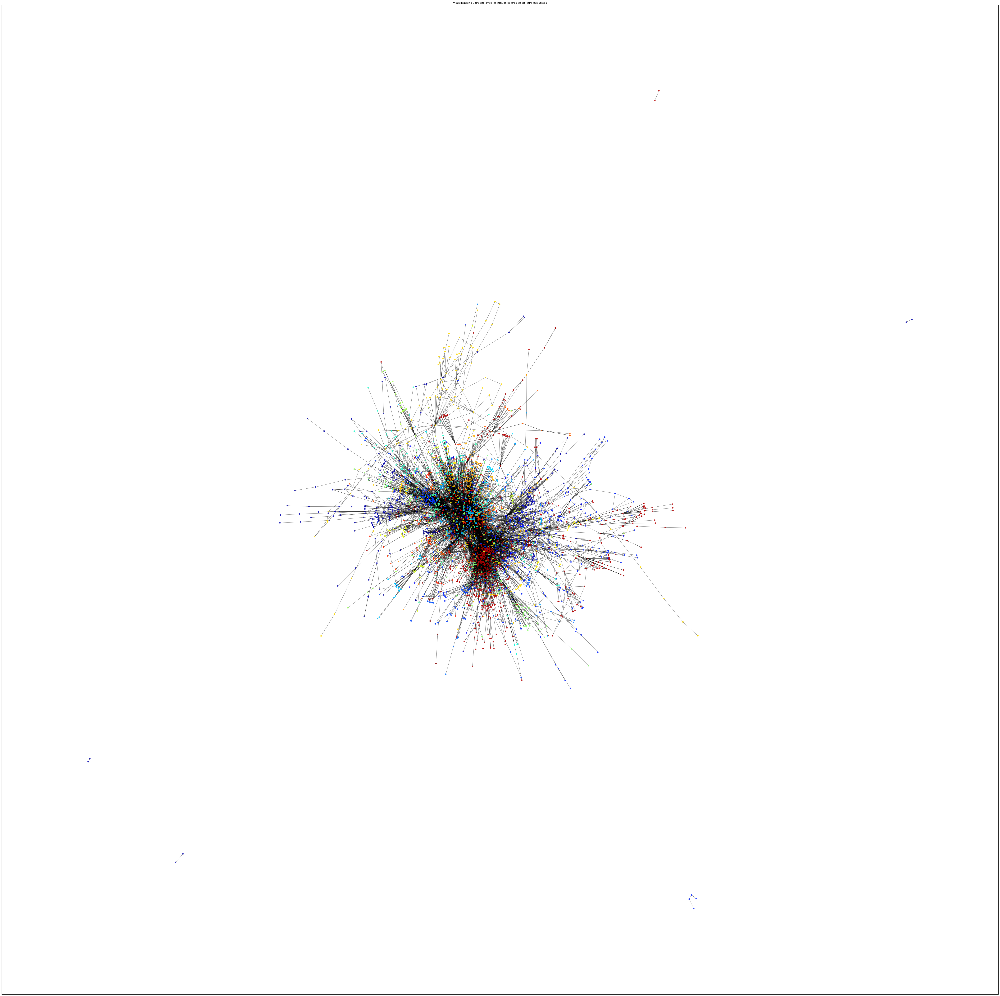

In [2]:
# Visualiser le graphe
visualize_graph(graph, encoded_labels, label_encoder)

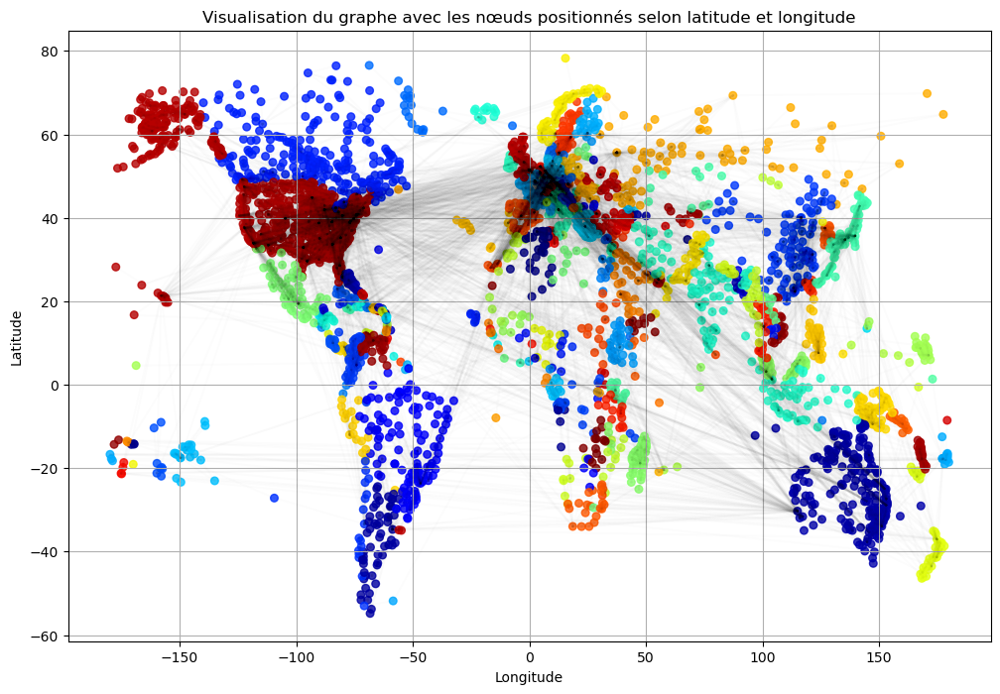

In [3]:
visualize_graph_with_geo(graph, latitudes, longitudes, encoded_labels, label_encoder)

In [10]:
import optuna
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch_geometric.nn import GCNConv
from sklearn.metrics import roc_auc_score, average_precision_score
from torch_geometric.transforms import RandomLinkSplit

# Définition du modèle avec des convolutions GCN
class GNNLinkPredictor(nn.Module):
    def __init__(self, in_channels, hidden_channels, out_channels):
        super(GNNLinkPredictor, self).__init__()
        self.conv1 = GCNConv(in_channels, hidden_channels)
        self.conv2 = GCNConv(hidden_channels, hidden_channels)
        self.fc = nn.Linear(hidden_channels, out_channels)

    def encode(self, x, edge_index):
        x = self.conv1(x, edge_index)
        x = F.relu(x)
        x = self.conv2(x, edge_index)
        return x

    def decode(self, z, edge_label_index):
        return (z[edge_label_index[0]] * z[edge_label_index[1]]).sum(dim=-1)

    def forward(self, x, edge_index, edge_label_index):
        z = self.encode(x, edge_index)
        return self.decode(z, edge_label_index)

# Fonction d'entraînement
def train(model, optimizer, criterion, train_data):
    model.train()
    optimizer.zero_grad()
    out = model(train_data.x, train_data.edge_index, train_data.edge_label_index)
    loss = criterion(out, train_data.edge_label)
    loss.backward()
    optimizer.step()
    return loss.item()

# Fonction de test
def test(model, data):
    model.eval()
    with torch.no_grad():
        pred = model(data.x, data.edge_index, data.edge_label_index)
        pred = pred.sigmoid().cpu().numpy()
        label = data.edge_label.cpu().numpy()
        auc = roc_auc_score(label, pred)
        ap = average_precision_score(label, pred)
        return auc, ap

# Fonction d'optimisation pour Optuna
def objective(trial):
    # Hyperparamètres suggérés par Optuna
    learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)
    hidden_size = trial.suggest_int('hidden_size', 20, 200, step=20)
    epochs = trial.suggest_int('epochs', 1, 20)

    # Créer le modèle
    model = GNNLinkPredictor(train_data.x.size(1), hidden_size, 1)
    optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)
    criterion = torch.nn.BCEWithLogitsLoss()

    # Entraîner le modèle
    for epoch in range(epochs):
        loss = train(model, optimizer, criterion, train_data)

    # Évaluer le modèle sur les données de validation
    auc, ap = test(model, val_data)

    return auc

# Cacher aléatoirement 10% des liens pour le test et 10% pour la validation
transform = RandomLinkSplit(is_undirected=True, num_val=0.1, num_test=0.1, add_negative_train_samples=False)
train_data, val_data, test_data = transform(pyg_graph)

# Utilisation d'Optuna pour l'optimisation
study = optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=5000)

# Afficher les meilleurs hyperparamètres
best_params = study.best_params
best_auc = study.best_value
print(f"Meilleurs paramètres : {best_params}, Meilleur AUC : {best_auc}")


[I 2024-10-20 01:10:33,620] A new study created in memory with name: no-name-8c69d022-8550-4265-aad7-2cd0096a1404
C:\Users\lolol\AppData\Local\Temp\ipykernel_15936\372242744.py:54: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)
[I 2024-10-20 01:10:33,727] Trial 0 finished with value: 0.858434661564073 and parameters: {'learning_rate': 6.72379429901278e-05, 'hidden_size': 40, 'epochs': 16}. Best is trial 0 with value: 0.858434661564073.
C:\Users\lolol\AppData\Local\Temp\ipykernel_15936\372242744.py:54: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate'

Meilleurs paramètres : {'learning_rate': 3.5384246049780463e-05, 'hidden_size': 60, 'epochs': 3}, Meilleur AUC : 0.9154777463350563


In [5]:
#Meilleurs paramètres : {'learning_rate': 3.5384246049780463e-05, 'hidden_size': 60, 'epochs': 3}, Meilleur AUC : 0.9154777463350563


In [25]:
import optuna
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch_geometric.nn import GCNConv
from sklearn.metrics import roc_auc_score, average_precision_score
from torch_geometric.transforms import RandomLinkSplit

# Définition du modèle avec des convolutions GCN
class GNNLinkPredictor(nn.Module):
    def __init__(self, in_channels, hidden_channels, out_channels):
        super(GNNLinkPredictor, self).__init__()
        self.conv1 = GCNConv(in_channels, hidden_channels)
        self.conv2 = GCNConv(hidden_channels, hidden_channels)
        self.fc = nn.Linear(hidden_channels, out_channels)

    def encode(self, x, edge_index):
        x = self.conv1(x, edge_index)
        x = F.relu(x)
        x = self.conv2(x, edge_index)
        return x

    def decode(self, z, edge_label_index):
        return (z[edge_label_index[0]] * z[edge_label_index[1]]).sum(dim=-1)

    def forward(self, x, edge_index, edge_label_index):
        z = self.encode(x, edge_index)
        return self.decode(z, edge_label_index)

# Fonction d'entraînement
def train(model, optimizer, criterion, train_data):
    model.train()
    optimizer.zero_grad()
    out = model(train_data.x, train_data.edge_index, train_data.edge_label_index)
    loss = criterion(out, train_data.edge_label)
    loss.backward()
    optimizer.step()
    return loss.item()

# Fonction de test
def test(model, data):
    model.eval()
    with torch.no_grad():
        pred = model(data.x, data.edge_index, data.edge_label_index)
        pred = pred.sigmoid().cpu().numpy()
        label = data.edge_label.cpu().numpy()
        auc = roc_auc_score(label, pred)
        ap = average_precision_score(label, pred)
        return auc, ap

# Fonction d'optimisation pour Optuna
def objective(trial):
    # Hyperparamètres suggérés par Optuna
    learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)
    hidden_size = trial.suggest_int('hidden_size', 20, 200, step=20)
    epochs = trial.suggest_int('epochs', 1, 20)

    # Créer le modèle
    model = GNNLinkPredictor(train_data.x.size(1), hidden_size, 1)
    optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)
    criterion = torch.nn.BCEWithLogitsLoss()

    # Entraîner le modèle
    for epoch in range(epochs):
        loss = train(model, optimizer, criterion, train_data)

    # Évaluer le modèle sur les données de validation
    auc, ap = test(model, val_data)

    return auc

# Cacher aléatoirement 10% des liens pour le test et 10% pour la validation
transform = RandomLinkSplit(is_undirected=True, num_val=0.1, num_test=0.1, add_negative_train_samples=False)
train_data, val_data, test_data = transform(pyg_graph)

# Utilisation des meilleurs paramètres
best_params = {'learning_rate': 3.5384246049780463e-05, 'hidden_size': 60, 'epochs': 3}
learning_rate = best_params['learning_rate']
hidden_size = best_params['hidden_size']
epochs = best_params['epochs']

# Créer le modèle et l'optimiseur
model = GNNLinkPredictor(train_data.x.size(1), hidden_size, 1)
optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)
criterion = torch.nn.BCEWithLogitsLoss()

# Entraîner le modèle avec les meilleurs paramètres
for epoch in range(epochs):
    loss = train(model, optimizer, criterion, train_data)

val_auc, val_ap = test(model, val_data)
print(f"Validation AUC : {val_auc:.4f}, Validation AP : {val_ap:.4f}")

# Évaluer le modèle sur l'ensemble de test
test_auc, test_ap = test(model, test_data)
print(f"Test AUC : {test_auc:.4f}, Test AP : {test_ap:.4f}")


Validation AUC : 0.8999, Validation AP : 0.8941
Test AUC : 0.9144, Test AP : 0.9125


In [40]:
# Cacher aléatoirement 10% des liens pour le test et 10% pour la validation
transform = RandomLinkSplit(is_undirected=True, num_val=0.2, num_test=0.2, add_negative_train_samples=False)
train_data, val_data, test_data = transform(pyg_graph)

# Utilisation des meilleurs paramètres
best_params = {'learning_rate': 1.3146915931339147e-05, 'hidden_size': 60, 'epochs': 6}
learning_rate = best_params['learning_rate']
hidden_size = best_params['hidden_size']
epochs = best_params['epochs']

# Créer le modèle et l'optimiseur
model = GNNLinkPredictor(train_data.x.size(1), hidden_size, 1)
optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)
criterion = torch.nn.BCEWithLogitsLoss()

# Entraîner le modèle avec les meilleurs paramètres
for epoch in range(epochs):
    loss = train(model, optimizer, criterion, train_data)

val_auc, val_ap = test(model, val_data)
print(f"Validation AUC : {val_auc:.4f}, Validation AP : {val_ap:.4f}")

# Évaluer le modèle sur l'ensemble de test
test_auc, test_ap = test(model, test_data)
print(f"Test AUC : {test_auc:.4f}, Test AP : {test_ap:.4f}")

Validation AUC : 0.8689, Validation AP : 0.8672
Test AUC : 0.8927, Test AP : 0.8966


In [11]:
# Cacher aléatoirement 20% des liens pour le test et 20% pour la validation
transform = RandomLinkSplit(is_undirected=True, num_val=0.2, num_test=0.2, add_negative_train_samples=False)
train_data, val_data, test_data = transform(pyg_graph)

# Utilisation d'Optuna pour l'optimisation
study = optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=5000)

# Afficher les meilleurs hyperparamètres
best_params = study.best_params
best_auc = study.best_value
print(f"Meilleurs paramètres : {best_params}, Meilleur AUC : {best_auc}")

[I 2024-10-20 01:23:00,681] A new study created in memory with name: no-name-78e24110-4aa7-43e5-8843-ca3895a196bc
C:\Users\lolol\AppData\Local\Temp\ipykernel_15936\372242744.py:54: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)
[I 2024-10-20 01:23:00,781] Trial 0 finished with value: 0.8605193494580294 and parameters: {'learning_rate': 7.124556672975399e-05, 'hidden_size': 200, 'epochs': 3}. Best is trial 0 with value: 0.8605193494580294.
C:\Users\lolol\AppData\Local\Temp\ipykernel_15936\372242744.py:54: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_ra

Meilleurs paramètres : {'learning_rate': 1.3146915931339147e-05, 'hidden_size': 60, 'epochs': 6}, Meilleur AUC : 0.9034023961526602


In [18]:
#Meilleurs paramètres : {'learning_rate': 1.3146915931339147e-05, 'hidden_size': 60, 'epochs': 6}, Meilleur AUC : 0.9034023961526602

In [5]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch_geometric.nn import GCNConv, VGAE
from torch_geometric.transforms import RandomLinkSplit
from sklearn.metrics import roc_auc_score, average_precision_score
import optuna

# VGAE Model Definition
class VGAEModel(VGAE):
    def __init__(self, in_channels, hidden_channels, out_channels):
        encoder = VariationalGCNEncoder(in_channels, hidden_channels, out_channels)
        super(VGAEModel, self).__init__(encoder)

class VariationalGCNEncoder(nn.Module):
    def __init__(self, in_channels, hidden_channels, out_channels):
        super(VariationalGCNEncoder, self).__init__()
        self.conv1 = GCNConv(in_channels, hidden_channels)
        self.conv_mu = GCNConv(hidden_channels, out_channels)
        self.conv_logvar = GCNConv(hidden_channels, out_channels)

    def forward(self, x, edge_index):
        x = F.relu(self.conv1(x, edge_index))
        return self.conv_mu(x, edge_index), self.conv_logvar(x, edge_index)

# Training Function
def train(model, optimizer, train_data):
    model.train()
    optimizer.zero_grad()
    z = model.encode(train_data.x, train_data.edge_index)
    loss = model.recon_loss(z, train_data.edge_index) + (1 / train_data.num_nodes) * model.kl_loss()
    loss.backward()
    optimizer.step()
    return loss.item()

# Test Function
def test(model, data):
    model.eval()
    with torch.no_grad():
        z = model.encode(data.x, data.edge_index)
        # Use sigmoid activation to convert logits to probabilities
        pred = model.decode(z, data.edge_label_index).sigmoid().cpu().numpy()
        label = data.edge_label.cpu().numpy()
        auc = roc_auc_score(label, pred)
        ap = average_precision_score(label, pred)
        return auc, ap

# Optuna Objective Function
def objective(trial):
    # Suggest hyperparameters
    learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)
    hidden_size = trial.suggest_int('hidden_size', 20, 200, step=20)
    latent_dim = trial.suggest_int('latent_dim', 16, 64)
    epochs = trial.suggest_int('epochs', 10, 100)

    # Create the VGAE model
    model = VGAEModel(train_data.x.size(1), hidden_size, latent_dim)
    optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)

    # Train the model
    for epoch in range(epochs):
        loss = train(model, optimizer, train_data)

    # Evaluate the model on validation data
    auc, ap = test(model, val_data)

    return auc

# Split the data into train, validation, and test sets
transform = RandomLinkSplit(is_undirected=True, num_val=0.1, num_test=0.1, add_negative_train_samples=False)
train_data, val_data, test_data = transform(pyg_graph)

# Use Optuna to optimize the hyperparameters
study = optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=1000)

# Print the best hyperparameters and the corresponding AUC
best_params = study.best_params
best_auc = study.best_value
print(f"Best parameters: {best_params}, Best AUC: {best_auc}")

# Evaluate the model on the test set
best_model = VGAEModel(train_data.x.size(1), best_params['hidden_size'], best_params['latent_dim'])
optimizer = torch.optim.Adam(best_model.parameters(), lr=best_params['learning_rate'])
for epoch in range(best_params['epochs']):
    train(best_model, optimizer, train_data)

test_auc, test_ap = test(best_model, test_data)
print(f"Test AUC: {test_auc:.4f}, Test AP: {test_ap:.4f}")


[I 2024-10-20 14:27:30,701] A new study created in memory with name: no-name-ae50d15a-1c0f-4204-8f28-43655a4730ba
C:\Users\lolol\AppData\Local\Temp\ipykernel_18300\816210836.py:51: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)
[I 2024-10-20 14:27:34,312] Trial 0 finished with value: 0.9472235010221914 and parameters: {'learning_rate': 0.0012645397089677533, 'hidden_size': 80, 'latent_dim': 45, 'epochs': 73}. Best is trial 0 with value: 0.9472235010221914.
C:\Users\lolol\AppData\Local\Temp\ipykernel_18300\816210836.py:51: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_logun

Best parameters: {'learning_rate': 0.00997613322373311, 'hidden_size': 200, 'latent_dim': 55, 'epochs': 98}, Best AUC: 0.9734562944958752
Test AUC: 0.9752, Test AP: 0.9783


In [ ]:
#Best parameters: {'learning_rate': 0.00997613322373311, 'hidden_size': 200, 'latent_dim': 55, 'epochs': 98}, Best AUC: 0.9734562944958752
#Test AUC: 0.9752, Test AP: 0.9783

In [6]:
# Split the data into train, validation, and test sets
transform = RandomLinkSplit(is_undirected=True, num_val=0.2, num_test=0.2, add_negative_train_samples=False)
train_data, val_data, test_data = transform(pyg_graph)

# Use Optuna to optimize the hyperparameters
study = optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=1000)

# Print the best hyperparameters and the corresponding AUC
best_params = study.best_params
best_auc = study.best_value
print(f"Best parameters: {best_params}, Best AUC: {best_auc}")

# Evaluate the model on the test set
best_model = VGAEModel(train_data.x.size(1), best_params['hidden_size'], best_params['latent_dim'])
optimizer = torch.optim.Adam(best_model.parameters(), lr=best_params['learning_rate'])
for epoch in range(best_params['epochs']):
    train(best_model, optimizer, train_data)

test_auc, test_ap = test(best_model, test_data)
print(f"Test AUC: {test_auc:.4f}, Test AP: {test_ap:.4f}")

[I 2024-10-20 15:30:46,871] A new study created in memory with name: no-name-1da0dffd-9876-45b0-8b5d-7bcd56cef905
C:\Users\lolol\AppData\Local\Temp\ipykernel_18300\816210836.py:51: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)
[I 2024-10-20 15:30:49,113] Trial 0 finished with value: 0.8387817238547363 and parameters: {'learning_rate': 2.6489815752268042e-05, 'hidden_size': 120, 'latent_dim': 60, 'epochs': 74}. Best is trial 0 with value: 0.8387817238547363.
C:\Users\lolol\AppData\Local\Temp\ipykernel_18300\816210836.py:51: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_log

Best parameters: {'learning_rate': 0.009997517954204104, 'hidden_size': 180, 'latent_dim': 57, 'epochs': 100}, Best AUC: 0.9662549032993802
Test AUC: 0.9729, Test AP: 0.9763


In [ ]:
#Best parameters: {'learning_rate': 0.009997517954204104, 'hidden_size': 180, 'latent_dim': 57, 'epochs': 100}, Best AUC: 0.9662549032993802
#Test AUC: 0.9729, Test AP: 0.9763

In [7]:
# Split the data into train, validation, and test sets
transform = RandomLinkSplit(is_undirected=True, num_val=0.1, num_test=0.1, add_negative_train_samples=True)
train_data, val_data, test_data = transform(pyg_graph)

# Use Optuna to optimize the hyperparameters
study = optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=1000)

# Print the best hyperparameters and the corresponding AUC
best_params = study.best_params
best_auc = study.best_value
print(f"Best parameters: {best_params}, Best AUC: {best_auc}")

# Evaluate the model on the test set
best_model = VGAEModel(train_data.x.size(1), best_params['hidden_size'], best_params['latent_dim'])
optimizer = torch.optim.Adam(best_model.parameters(), lr=best_params['learning_rate'])
for epoch in range(best_params['epochs']):
    train(best_model, optimizer, train_data)

test_auc, test_ap = test(best_model, test_data)
print(f"Test AUC: {test_auc:.4f}, Test AP: {test_ap:.4f}")

[I 2024-10-20 16:21:25,245] A new study created in memory with name: no-name-1831a1e6-9caf-4861-a6c6-03d2173ff309
C:\Users\lolol\AppData\Local\Temp\ipykernel_18300\816210836.py:51: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)
[I 2024-10-20 16:21:25,693] Trial 0 finished with value: 0.8854654625825553 and parameters: {'learning_rate': 0.00027476813523456155, 'hidden_size': 160, 'latent_dim': 56, 'epochs': 11}. Best is trial 0 with value: 0.8854654625825553.
C:\Users\lolol\AppData\Local\Temp\ipykernel_18300\816210836.py:51: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_log

Best parameters: {'learning_rate': 0.006801596938885402, 'hidden_size': 100, 'latent_dim': 57, 'epochs': 96}, Best AUC: 0.9763505036774893
Test AUC: 0.9677, Test AP: 0.9707


In [9]:
import optuna
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch_geometric.nn import GCNConv
from sklearn.metrics import roc_auc_score, average_precision_score
from torch_geometric.transforms import RandomLinkSplit

# Définition du modèle GNN avec une seule couche
class GNNLinkPredictorAblation(nn.Module):
    def __init__(self, in_channels, hidden_channels, out_channels):
        super(GNNLinkPredictorAblation, self).__init__()
        self.conv1 = GCNConv(in_channels, hidden_channels)
        self.fc = nn.Linear(hidden_channels, out_channels)

    def encode(self, x, edge_index):
        x = self.conv1(x, edge_index)
        x = F.relu(x)
        return x

    def decode(self, z, edge_label_index):
        return (z[edge_label_index[0]] * z[edge_label_index[1]]).sum(dim=-1)

    def forward(self, x, edge_index, edge_label_index):
        z = self.encode(x, edge_index)
        return self.decode(z, edge_label_index)

# Fonction d'entraînement
def train(model, optimizer, criterion, train_data):
    model.train()
    optimizer.zero_grad()
    out = model(train_data.x, train_data.edge_index, train_data.edge_label_index)
    loss = criterion(out, train_data.edge_label)
    loss.backward()
    optimizer.step()
    return loss.item()

# Fonction de test
def test(model, data):
    model.eval()
    with torch.no_grad():
        pred = model(data.x, data.edge_index, data.edge_label_index)
        pred = pred.sigmoid().cpu().numpy()
        label = data.edge_label.cpu().numpy()
        auc = roc_auc_score(label, pred)
        ap = average_precision_score(label, pred)
        return auc, ap

# Cacher aléatoirement 10% des liens pour le test et 10% pour la validation
transform = RandomLinkSplit(is_undirected=True, num_val=0.1, num_test=0.1, add_negative_train_samples=False)
train_data, val_data, test_data = transform(pyg_graph)

# Utilisation des meilleurs paramètres
best_params = {'learning_rate': 3.5384246049780463e-05, 'hidden_size': 60, 'epochs': 3}
learning_rate = best_params['learning_rate']
hidden_size = best_params['hidden_size']
epochs = best_params['epochs']

# Créer le modèle et l'optimiseur
model = GNNLinkPredictorAblation(train_data.x.size(1), hidden_size, 1)
optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)
criterion = torch.nn.BCEWithLogitsLoss()

# Entraîner le modèle avec les meilleurs paramètres
for epoch in range(epochs):
    loss = train(model, optimizer, criterion, train_data)

# Évaluer le modèle sur l'ensemble de validation
val_auc, val_ap = test(model, val_data)
print(f"Validation AUC : {val_auc:.4f}, Validation AP : {val_ap:.4f}")



Validation AUC : 0.7820, Validation AP : 0.7964


In [32]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch_geometric.nn import GCNConv, VGAE
from torch_geometric.transforms import RandomLinkSplit
from sklearn.metrics import roc_auc_score, average_precision_score
import optuna

# Définition du modèle VGAE
class VGAEModel(VGAE):
    def __init__(self, in_channels, hidden_channels, out_channels):
        encoder = VariationalGCNEncoder(in_channels, hidden_channels, out_channels)
        super(VGAEModel, self).__init__(encoder)

class VariationalGCNEncoder(nn.Module):
    def __init__(self, in_channels, hidden_channels, out_channels):
        super(VariationalGCNEncoder, self).__init__()
        self.conv1 = GCNConv(in_channels, hidden_channels)
        self.conv_mu = GCNConv(hidden_channels, out_channels)
        self.conv_logvar = GCNConv(hidden_channels, out_channels)

    def forward(self, x, edge_index):
        x = F.relu(self.conv1(x, edge_index))
        return self.conv_mu(x, edge_index), self.conv_logvar(x, edge_index)

# Fonction d'entraînement sans perte KL
def train_vgae_no_kl(model, optimizer, train_data):
    model.train()
    optimizer.zero_grad()
    z = model.encode(train_data.x, train_data.edge_index)
    loss = model.recon_loss(z, train_data.edge_index)  # Suppression de la perte KL
    loss.backward()
    optimizer.step()
    return loss.item()

# Fonction de test
def test(model, data):
    model.eval()
    with torch.no_grad():
        z = model.encode(data.x, data.edge_index)
        
        # Utilisation des indices de liaisons réels pour les prédictions
        pred = model.decode(z, data.edge_label_index).sigmoid().cpu().numpy()  # Changer ici
        label = data.edge_label.cpu().numpy()
        auc = roc_auc_score(label, pred)
        ap = average_precision_score(label, pred)
        return auc, ap

# Cacher aléatoirement 10% des liens pour le test et 10% pour la validation
transform = RandomLinkSplit(is_undirected=True, num_val=0.1, num_test=0.1, add_negative_train_samples=False)
train_data, val_data, test_data = transform(pyg_graph)

# Utilisation des meilleurs paramètres
best_params = {'learning_rate': 0.00997613322373311, 'hidden_size': 200, 'latent_dim': 55, 'epochs': 98}
learning_rate = best_params['learning_rate']
hidden_size = best_params['hidden_size']
latent_dim = best_params['latent_dim']
epochs = best_params['epochs']

# Créer le modèle et l'optimiseur
best_model = VGAEModel(train_data.x.size(1), hidden_size, latent_dim)
optimizer = torch.optim.Adam(best_model.parameters(), lr=learning_rate)

# Entraîner le modèle avec les meilleurs paramètres
for epoch in range(epochs):
    loss = train_vgae_no_kl(best_model, optimizer, train_data)

# Évaluer le modèle sur l'ensemble de validation
val_auc, val_ap = test(best_model, val_data)
print(f"Validation AUC : {val_auc:.4f}, Validation AP : {val_ap:.4f}")

# Évaluer le modèle sur l'ensemble de test
test_auc, test_ap = test(best_model, test_data)
print(f"Test AUC : {test_auc:.4f}, Test AP : {test_ap:.4f}")


Validation AUC : 0.9704, Validation AP : 0.9754
Test AUC : 0.9692, Test AP : 0.9714


In [63]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch_geometric.nn import VGAE
from torch_geometric.transforms import RandomLinkSplit
from sklearn.metrics import roc_auc_score, average_precision_score

# Définition du modèle VGAE
class VGAEModel(VGAE):
    def __init__(self, in_channels, hidden_channels, out_channels):
        encoder = VariationalLinearEncoder(in_channels, hidden_channels, out_channels)
        super(VGAEModel, self).__init__(encoder)

class VariationalLinearEncoder(nn.Module):
    def __init__(self, in_channels, hidden_channels, out_channels):
        super(VariationalLinearEncoder, self).__init__()
        self.fc1 = nn.Linear(in_channels, hidden_channels)
        self.fc_mu = nn.Linear(hidden_channels, out_channels)
        self.fc_logvar = nn.Linear(hidden_channels, out_channels)

    def forward(self, x, edge_index=None):
        x = F.relu(self.fc1(x))
        mu = self.fc_mu(x)
        logvar = self.fc_logvar(x)
        return mu, logvar

# Fonction d'entraînement sans perte KL
def train_vgae_no_kl(model, optimizer, train_data):
    model.train()
    optimizer.zero_grad()
    z = model.encode(train_data.x, train_data.edge_index)
    loss = model.recon_loss(z, train_data.edge_index)  # Suppression de la perte KL
    loss.backward()
    optimizer.step()
    return loss.item()

# Fonction de test
def test(model, data):
    model.eval()
    with torch.no_grad():
        z = model.encode(data.x, data.edge_index)
        # Utilisation des indices de liaisons réels pour les prédictions
        pred = model.decode(z, data.edge_label_index).sigmoid().cpu().numpy()
        label = data.edge_label.cpu().numpy()
        auc = roc_auc_score(label, pred)
        ap = average_precision_score(label, pred)
        return auc, ap

# Cacher aléatoirement 10% des liens pour le test et 10% pour la validation
transform = RandomLinkSplit(is_undirected=True, num_val=0.1, num_test=0.1, add_negative_train_samples=False)
train_data, val_data, test_data = transform(pyg_graph)

# Utilisation des meilleurs paramètres
best_params = {'learning_rate': 0.00997613322373311, 'hidden_size': 200, 'latent_dim': 55, 'epochs': 98}
learning_rate = best_params['learning_rate']
hidden_size = best_params['hidden_size']
latent_dim = best_params['latent_dim']
epochs = best_params['epochs']

# Créer le modèle et l'optimiseur
best_model = VGAEModel(train_data.x.size(1), hidden_size, latent_dim)
optimizer = torch.optim.Adam(best_model.parameters(), lr=learning_rate)

# Entraîner le modèle avec les meilleurs paramètres
for epoch in range(epochs):
    loss = train_vgae_no_kl(best_model, optimizer, train_data)

# Évaluer le modèle sur l'ensemble de validation
val_auc, val_ap = test(best_model, val_data)
print(f"Validation AUC : {val_auc:.4f}, Validation AP : {val_ap:.4f}")

# Évaluer le modèle sur l'ensemble de test
test_auc, test_ap = test(best_model, test_data)
print(f"Test AUC : {test_auc:.4f}, Test AP : {test_ap:.4f}")


Validation AUC : 0.9419, Validation AP : 0.9457
Test AUC : 0.9320, Test AP : 0.9346


In [66]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch_geometric.nn import GCNConv, VGAE
from torch_geometric.transforms import RandomLinkSplit
from sklearn.metrics import roc_auc_score, average_precision_score

# Définition du modèle VGAE
class VGAEModel(VGAE):
    def __init__(self, in_channels, hidden_channels, out_channels):
        encoder = VariationalGCNEncoder(in_channels, hidden_channels, out_channels)
        super(VGAEModel, self).__init__(encoder)

    # Remplacement de la méthode decode par un produit scalaire simple
    def decode(self, z, edge_label_index):
        # Calcul du produit scalaire des représentations latentes des nœuds
        src = z[edge_label_index[0]]
        dst = z[edge_label_index[1]]
        return (src * dst).sum(dim=1)  # Produit scalaire

class VariationalGCNEncoder(nn.Module):
    def __init__(self, in_channels, hidden_channels, out_channels):
        super(VariationalGCNEncoder, self).__init__()
        self.conv1 = GCNConv(in_channels, hidden_channels)
        self.conv_mu = GCNConv(hidden_channels, out_channels)
        self.conv_logvar = GCNConv(hidden_channels, out_channels)

    def forward(self, x, edge_index):
        x = F.relu(self.conv1(x, edge_index))
        return self.conv_mu(x, edge_index), self.conv_logvar(x, edge_index)

# Fonction d'entraînement sans perte KL
def train_vgae_no_kl(model, optimizer, train_data):
    model.train()
    optimizer.zero_grad()
    z = model.encode(train_data.x, train_data.edge_index)
    loss = model.recon_loss(z, train_data.edge_index)  # Suppression de la perte KL
    loss.backward()
    optimizer.step()
    return loss.item()

# Fonction de test
def test(model, data):
    model.eval()
    with torch.no_grad():
        z = model.encode(data.x, data.edge_index)
        # Utilisation des indices de liaisons réels pour les prédictions
        pred = model.decode(z, data.edge_label_index).sigmoid().cpu().numpy()
        label = data.edge_label.cpu().numpy()
        auc = roc_auc_score(label, pred)
        ap = average_precision_score(label, pred)
        return auc, ap

# Cacher aléatoirement 10% des liens pour le test et 10% pour la validation
transform = RandomLinkSplit(is_undirected=True, num_val=0.1, num_test=0.1, add_negative_train_samples=False)
train_data, val_data, test_data = transform(pyg_graph)

# Utilisation des meilleurs paramètres
best_params = {'learning_rate': 0.00997613322373311, 'hidden_size': 200, 'latent_dim': 55, 'epochs': 98}
learning_rate = best_params['learning_rate']
hidden_size = best_params['hidden_size']
latent_dim = best_params['latent_dim']
epochs = best_params['epochs']

# Créer le modèle et l'optimiseur
best_model = VGAEModel(train_data.x.size(1), hidden_size, latent_dim)
optimizer = torch.optim.Adam(best_model.parameters(), lr=learning_rate)

# Entraîner le modèle avec les meilleurs paramètres
for epoch in range(epochs):
    loss = train_vgae_no_kl(best_model, optimizer, train_data)

# Évaluer le modèle sur l'ensemble de validation
val_auc, val_ap = test(best_model, val_data)
print(f"Validation AUC : {val_auc:.4f}, Validation AP : {val_ap:.4f}")

# Évaluer le modèle sur l'ensemble de test
test_auc, test_ap = test(best_model, test_data)
print(f"Test AUC : {test_auc:.4f}, Test AP : {test_ap:.4f}")


Validation AUC : 0.9688, Validation AP : 0.9739
Test AUC : 0.9778, Test AP : 0.9806
